<a href="https://colab.research.google.com/github/valerielimyh/Intent_Recognition_using_BERT/blob/master/01_Modeling_using_BOW_and_Log_Reg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from collections import Counter

#settings
pd.set_option('display.max_colwidth', -1)
np.set_printoptions(threshold=np.inf)
pd.options.display.max_columns = None
pd.options.display.max_rows = None
from IPython.core.interactiveshell import InteractiveShell  
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.2)



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
!gdown --id 1OlcvGWReJMuyYQuOZm149vHWwPtlboR6 --output train.csv
!gdown --id 1Oi5cRlTybuIF2Fl5Bfsr-KkqrXrdt77w --output valid.csv
!gdown --id 1ep9H6-HvhB4utJRLVcLzieWNUSG3P_uF --output test.csv

Downloading...
From: https://drive.google.com/uc?id=1OlcvGWReJMuyYQuOZm149vHWwPtlboR6
To: /content/train.csv
100% 799k/799k [00:00<00:00, 51.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Oi5cRlTybuIF2Fl5Bfsr-KkqrXrdt77w
To: /content/valid.csv
100% 43.3k/43.3k [00:00<00:00, 2.80MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ep9H6-HvhB4utJRLVcLzieWNUSG3P_uF
To: /content/test.csv
100% 43.1k/43.1k [00:00<00:00, 21.2MB/s]


In [0]:
train = pd.read_csv("train.csv")
valid = pd.read_csv("valid.csv")
test = pd.read_csv("test.csv")

In [4]:
train.head(3)

,text,intent
0,listen to westbam alumb allergic on google music,PlayMusic
1,add step to me to the 50 clásicos playlist,AddToPlaylist
2,i give this current textbook a rating value of...,RateBook


In [10]:
valid.head(1)
test.head(1)

,text,intent
0,i d like to have this track onto my classical relaxations playlist,AddToPlaylist


,text,intent
0,add sabrina salerno to the grime instrumentals playlist,AddToPlaylist


In [20]:
# Text preprocessing steps - remove numbers, captial letters and punctuation
import re
import string

alphanumeric = lambda x: re.sub('\w*\d\w*', ' ', x) # remove words with numbers
punc_lower = lambda x: re.sub('[%s]' % re.escape(string.punctuation), ' ', x.lower())

train['text'] = train.text.map(alphanumeric).map(punc_lower)
train.head(3)

,text,intent
0,listen to westbam alumb allergic on google music,PlayMusic
1,add step to me to the clásicos playlist,AddToPlaylist
2,i give this current textbook a rating value of and a best rating of,RateBook


In [5]:

#strip all punctuation, lower text
train['text'] = train.text.str.replace(r"\W","").str.lower()
train.head(3)

,text,intent
0,listentowestbamalumballergicongooglemusic,PlayMusic
1,addsteptometothe50clásicosplaylist,AddToPlaylist
2,igivethiscurrenttextbookaratingvalueof1andabes...,RateBook


In [0]:
valid['text'] = valid.text.map(alphanumeric).map(punc_lower)
test['text'] = test.text.map(alphanumeric).map(punc_lower)

In [0]:
mask = df.Positively_rated < 1 
text = " ".join(review for review in df[mask].RAW_Text)
stopwords = set(STOPWORDS)

# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords,max_font_size=50, max_words=300,background_color="white",colormap = 'magma').generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

(-0.5, 399.5, 199.5, -0.5)

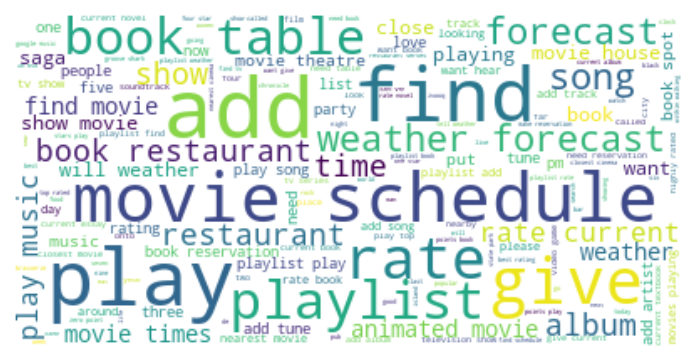

In [22]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text_train = " ".join(msg for msg in train.text)
stopwords = set(STOPWORDS)


# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords,max_font_size=50, max_words=300,background_color="white",colormap = 'viridis').generate(text_train)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")


# Modeling with BOW

Let's start with our first bag of words model without any lemmatization and stopwords removal

In [0]:
train_val = train.append(valid).reset_index(drop=True)

In [0]:
X_train_val = train_val.text
y_train_val = train_val.intent
X_test = test.text
y_test = test.intent

In [31]:
from sklearn.feature_extraction.text import CountVectorizer

# Fit the CountVectorizer to the training data (Bag of Words model)
cv1 = CountVectorizer(stop_words='english')

X_train_cv1 = cv1.fit_transform(X_train_val)
X_test_cv1  = cv1.transform(X_test)

pd.DataFrame(X_train_cv1.toarray(), columns=cv1.get_feature_names()).head()

,aagathadi,aaliyah,aap,aaron,abacab,abacus,abbas,abbott,abbruzzese,abby,abdel,abdication,abdollahzadeh,abdu,abdul,abe,abel,abhijeet,abhyankar,abigail,abo,abode,abolition,abominations,aboriginal,abrar,absolutely,abstinence,abuja,abyss,academy,acapella,access,accesss,acchiappafantasmi,accident,accidentally,accidents,accion,accommodate,according,accounting,accused,ace,achilles,acid,acompañado,acoustic,acoustics,acres,act,acta,action,active,activists,activity,actress,actrices,acworth,acústico,ad,adam,adams,adaptive,adassa,add,added,addicted,adding,addition,addo,address,adela,adelaide,adele,adeline,adeus,adeyto,adieu,adkins,adler,administration,administrative,admiralty,admire,adobe,adolf,adrenaline,adrian,adriana,advances,adventure,adventures,advise,advocate,adyathe,aerial,afdlin,affair,affairs,affections,afghan,afghanistan,afi,aflame,africa,african,africana,aftercluv,afterlife,afternoon,afterwork,agate,agatsuma,age,agent,ages,agincourt,agnew,agnolotti,agreable,agua,aguila,aguilar,ah,ahbez,ahead,ahmad,ahmed,ai,aiba,aiken,ain,aioli,aion,air,aira,airbnb,aire,aired,airey,airi,airport,airto,airy,aise,aisha,aitken,aj,ajinoam,ajoy,ak,akers,akhtar,aki,akin,akinyele,akira,al,alabama,alain,alamo,alan,alana,alas,alasdair,alaska,alba,albania,albano,albany,albarn,albert,alberton,albertson,albini,albino,album,albums,alchemist,alchemyst,alden,alderwood,alejandra,alejandro,alerce,alex,alexander,alexandra,alexandrovich,alexia,alexis,alfonzo,alfred,alfredo,algeria,ali,alibi,alice,alien,aliens,alisha,alison,alissa,alive,alizadeh,alkabli,alla,allah,allan,allardt,allcock,allegiance,allen,allenton,allentown,allenwood,allergic,alles,alley,allison,allman,alloway,allows,ally,alma,almighty,almyra,alok,alpha,alphatia,alphonso,alps,als,alta,altai,alte,alternativa,alternative,alternativo,altomare,alton,altri,altyn,alumb,alvarez,alyson,amal,amanda,amandes,amano,amar,amarillo,amarth,amber,ambient,ambiente,ambition,ambitions,ambler,ambush,amc,amco,amelia,amenia,america,american,americana,americans,amhlaoibh,ami,amigos,amii,amina,amir,amirbai,amityville,ammonia,ammunition,amnicon,amon,amor,amore,amorevoli,amott,amour,amrithavaahini,amsterdam,amt,amusements,amy,ana,anacreon,anagram,analysis,analytical,analyzer,anarchy,anasa,anatoljewitsch,anatomy,anatone,anbessa,anchor,ancient,anders,anderson,andersson,andes,andino,andorra,andrea,andreas,andrew,andrews,andrés,andy,angel,angela,angeles,angeline,angelita,angelo,angels,angelus,angle,angling,angola,angry,anguilla,anheuser,anila,animal,animals,animated,animation,anjo,ankimo,ann,anna,annabella,anne,anneliese,annesley,annet,annette,annie,annihilated,anniston,anniversary,annunciation,annunzio,anochecer,anofriyev,anonymous,anson,ansonia,anston,anstruther,answers,antarctica,antaño,antebellum,antelope,antenas,antero,anthem,anthems,anthology,anthony,anti,antietam,antigua,antilles,antisleep,antoinette,antonella,antonia,antonito,antony,ants,anweshaa,anymore,aoyama,apache,apart,apartment,apathy,ape,apes,aphex,api,apocalisse,apocalypse,apollo,apolobamba,apolon,apostolos,apothecary,app,appalachian,apparatus,apple,appleby,apples,appleyard,applicatae,applied,appreciation,approach,apr,april,aprite,aqua,aquariums,ar,arab,arabia,aragon,aransas,arashiro,arborea,arcadian,arcane,arch,archer,archie,archive,archivist,arcims,arclight,arcola,arctic,area,areas,aree,arena,ares,aretha,argentina,argentinian,argentino,arguin,argumentative,argusville,ari,aria,arias,arista,ariston,arizona,arkansas,arkinda,arkport,arlene,arletta,armageddon,armand,armen,armenia,armenian,armik,armistead,armour,arms,armstrong,army,arnauld,arnett,arons,aroostook,arp,arranged,array,arrows,arsenault,arson,arsène,art,artani,arthur,artifacts,artist,aruba,ascension,ash,asha,ashby,ashes,ashford,ashibetsu,ashland,ashlee,ashley,ashmore,asia,asian,asiate,ask,asking,aspinwall,aspro,assassin,assassination,assault,assign,assignments,associated,association,assumption,astley,astonishing,astor,astronauts,astronomical,astronomy,asyikin,atanassow,atari,atch,ate,athol,atla,atlantic,atlant

In [32]:
# The second document-term matrix has both unigrams and bigrams, and indicators instead of counts
cv2 = CountVectorizer(ngram_range=(1,2), binary=True, stop_words='english')

X_train_cv2 = cv2.fit_transform(X_train_val)
X_test_cv2  = cv2.transform(X_test)

pd.DataFrame(X_train_cv2.toarray(), columns=cv2.get_feature_names()).head()

,aagathadi,aagathadi women,aaliyah,aap,aap aise,aaron,abacab,abacab beryl,abacus,abacus zero,abbas,abbas youtube,abbott,abbott costello,abbruzzese,abbruzzese tune,abby,abby saga,abdel,abdel halim,abdication,abdication movie,abdollahzadeh,abdollahzadeh youtube,abdu,abdul,abdul classic,abdul malik,abdul musica,abe,abe laboriel,abel,abel sánchez,abhijeet,abhijeet bhattacharya,abhyankar,abigail,abigail concentración,abo,abo wi,abode,abode chronicle,abolition,abolition britain,abominations,abominations rare,aboriginal,aboriginal port,abrar,abrar ul,absolutely,absolutely positively,absolutely sweet,abstinence,abstinence teacher,abuja,abyss,abyss kerasotes,abyss wonders,academy,academy starship,acapella,acapella music,access,access ahmad,access party,access pool,accesss,accesss party,acchiappafantasmi,acchiappafantasmi playing,accident,accident analysis,accidentally,accidentally love,accidents,accion,accion newspaper,accommodate,accommodate gretchen,accommodate members,accommodate party,accommodate weeks,according,according john,according paris,accounting,accused,accused points,ace,ace hood,ace saddle,ace spades,ace ventura,achilles,achilles tortoise,acid,acid punk,acompañado,acoustic,acoustic blues,acoustic concentration,acoustic covers,acoustic love,acoustic playlist,acoustic soul,acoustic spring,acoustics,acres,acres party,act,act terror,act valor,acta,acta mathematicae,action,action dickinson,action saint,active,activists,activists wars,activity,activity ghost,activity playlist,activity summer,actress,actress newest,actrices,acworth,acworth north,acústico,acústico playlist,ad,ad amal,ad artist,ad czarna,ad hoc,ad known,ad nauseam,ad sabah,ad track,adam,adam clayton,adam deibert,adam jones,adam playing,adam yauch,adams,adams roxanne,adaptive,adaptive coloration,adassa,adassa twenties,add,add abacab,add abrar,add absolutely,add ace,add acoustic,add adam,add adele,add afdlin,add agua,add air,add aira,add ajoy,add alain,add alan,add album,add alexandra,add alexia,add ali,add als,add amir,add ana,add anacreon,add andrés,add andy,add angela,add animal,add anna,add annabella,add annesley,add annette,add anson,add anthony,add anti,add antisleep,add apathy,add appreciation,add aprite,add armen,add armistead,add arnett,add art,add arthur,add artist,add ashes,add ashley,add atticus,add autry,add ava,add avispa,add baby,add bad,add banana,add banking,add barbara,add baro,add barry,add bashful,add beast,add beatles,add beatmaster,add bedroom,add beijing,add belgian,add bert,add best,add beverley,add bien,add big,add bilal,add billy,add black,add blag,add block,add blood,add blowfly,add blue,add bob,add bobby,add bon,add bone,add bonga,add bonobo,add booze,add bossa,add boy,add boyce,add brad,add brazilian,add bret,add brian,add bright,add bring,add broken,add bronislau,add bryan,add bslade,add buddy,add bulat,add bum,add burnside,add butterfly,add cabi,add cake,add cal,add cale,add caleigh,add camille,add candlelight,add carmel,add cary,add cellular,add chamberlain,add chamillionaire,add chan,add changes,add chas,add checkmate,add chen,add child,add children,add chill,add chirping,add chong,add chris,add christopher,add chrome,add chér,add cj,add classic,add classical,add claudine,add clem,add cleo,add cliffs,add clint,add club,add come,add como,add compilation,add concrete,add connee,add contact,add coordinates,add cordell,add count,add country,add covenant,add crabfish,add cream,add cross,add crowd,add crying,add curious,add current,add currently,add curse,add cut,add daedelus,add dahmer,add daigo,add dallas,add dan,add dancefloor,add daniel,add danny,add dark,add darkest,add darkness,add dave,add david,add day,add dean,add dear,add deasy,add decade,add defined,add dena,add der,add derek,add desert,add det,add deuce,add deus,add devil,add diarios,add dickey,add died,add digging,add dimitri,add disco,add dj,add doing,add don,add dr,add driven,add dying,add décadas,add días,add east,add eef,add el,add elastic,add elbridge,add elkie,add emanue

Try classifying using Logistic Regression

In [0]:
# Create a logistic regression model to use
lr = LogisticRegression()

In [35]:
# Train the first model
lr.fit(X_train_cv1, y_train_val)
y_pred_cv1 = lr.predict(X_test_cv1)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [39]:
# Train the second model
lr.fit(X_train_cv2, y_train_val)
y_pred_cv2 = lr.predict(X_test_cv2)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [0]:
classes = train.intent.unique().tolist()

In [0]:
# Create a function to calculate the error metrics, since we'll be doing this several times

def conf_matrix(actual, predicted):
    conf_mat = confusion_matrix(actual, predicted)
    df_cm = pd.DataFrame(conf_mat, index=classes, columns=classes)
    cm = sns.heatmap(df_cm, annot=True, fmt="d")
    cm.yaxis.set_ticklabels(cm.yaxis.get_ticklabels(), rotation=0, ha='right')
    cm.xaxis.set_ticklabels(cm.xaxis.get_ticklabels(), rotation=30, ha='right')

    return cm

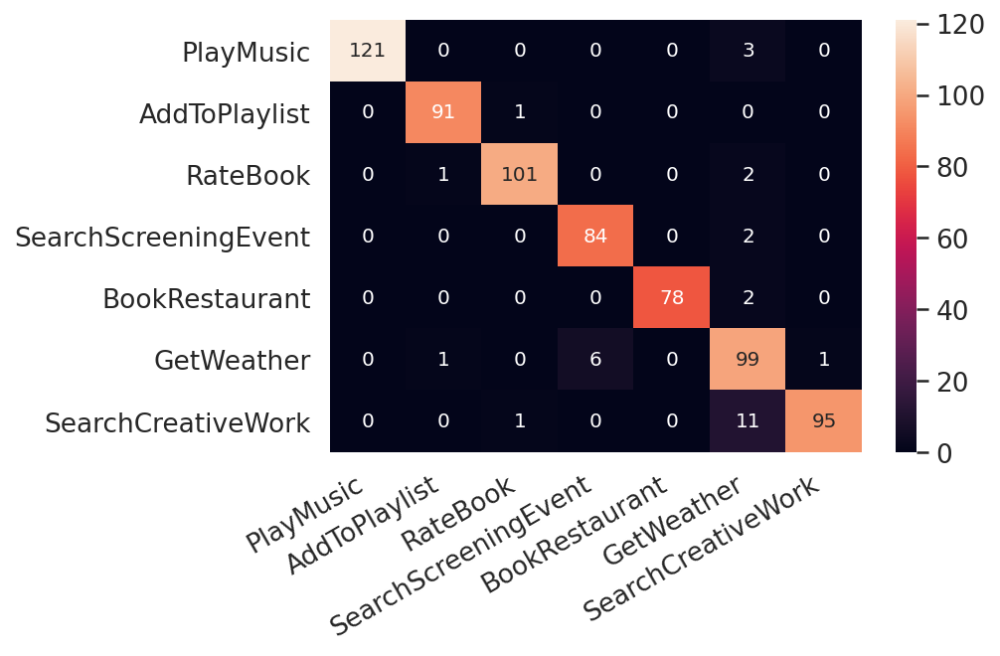

In [63]:
# The heat map for the first logistic regression model
cm1 = conf_matrix(y_test, y_pred_cv1)

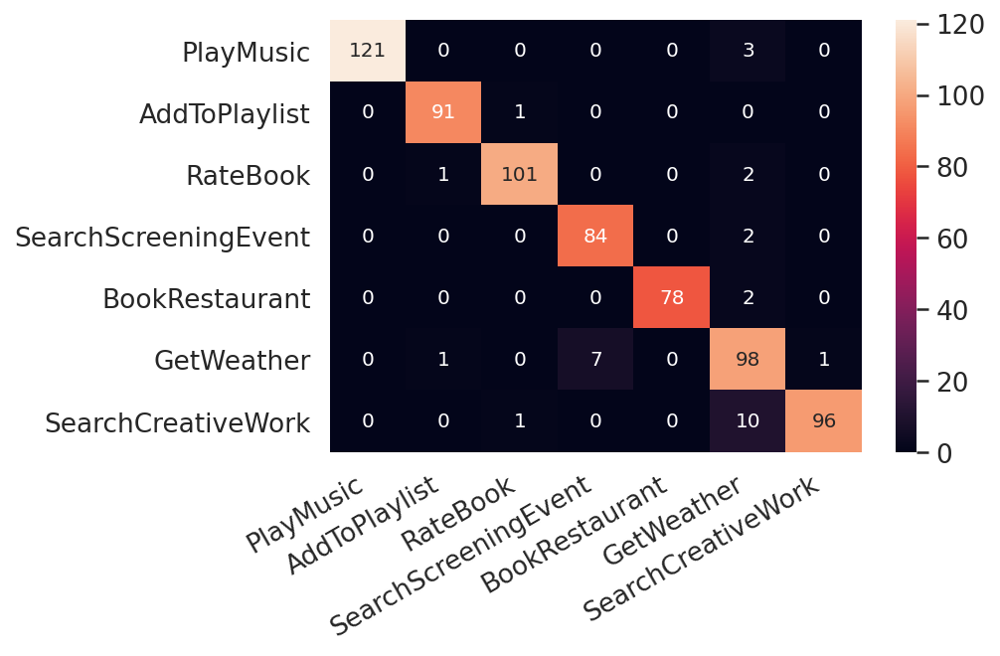

In [64]:
# The heat map for the second logistic regression model
cm2 = conf_matrix(y_test, y_pred_cv2)

In [66]:
# classification report for first logistic regression model
print(classification_report(y_test, y_pred_cv1, target_names=classes))

                      precision    recall  f1-score   support

           PlayMusic       1.00      0.98      0.99       124
       AddToPlaylist       0.98      0.99      0.98        92
            RateBook       0.98      0.97      0.98       104
SearchScreeningEvent       0.93      0.98      0.95        86
      BookRestaurant       1.00      0.97      0.99        80
          GetWeather       0.83      0.93      0.88       107
  SearchCreativeWork       0.99      0.89      0.94       107

            accuracy                           0.96       700
           macro avg       0.96      0.96      0.96       700
        weighted avg       0.96      0.96      0.96       700



In [68]:
# classification report for the second logistic regression model
print(classification_report(y_test, y_pred_cv2, target_names=classes))

                      precision    recall  f1-score   support

           PlayMusic       1.00      0.98      0.99       124
       AddToPlaylist       0.98      0.99      0.98        92
            RateBook       0.98      0.97      0.98       104
SearchScreeningEvent       0.92      0.98      0.95        86
      BookRestaurant       1.00      0.97      0.99        80
          GetWeather       0.84      0.92      0.88       107
  SearchCreativeWork       0.99      0.90      0.94       107

            accuracy                           0.96       700
           macro avg       0.96      0.96      0.96       700
        weighted avg       0.96      0.96      0.96       700



In [70]:
# Fit the first Naive Bayes model
from sklearn.naive_bayes import MultinomialNB

mnb = MultinomialNB()
mnb.fit(X_train_cv1, y_train_val)

y_pred_cv1_nb = mnb.predict(X_test_cv1)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [72]:
mnb.fit(X_train_cv2, y_train_val)

y_pred_cv2_nb = mnb.predict(X_test_cv2)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [73]:
# classification report for first logistic regression model
print(classification_report(y_test, y_pred_cv1_nb, target_names=classes))

                      precision    recall  f1-score   support

           PlayMusic       0.95      0.98      0.97       124
       AddToPlaylist       0.96      1.00      0.98        92
            RateBook       0.98      0.98      0.98       104
SearchScreeningEvent       0.87      0.95      0.91        86
      BookRestaurant       0.94      0.99      0.96        80
          GetWeather       0.94      0.79      0.86       107
  SearchCreativeWork       0.93      0.92      0.92       107

            accuracy                           0.94       700
           macro avg       0.94      0.94      0.94       700
        weighted avg       0.94      0.94      0.94       700



In [74]:
# classification report for the second logistic regression model
print(classification_report(y_test, y_pred_cv2_nb, target_names=classes))

                      precision    recall  f1-score   support

           PlayMusic       0.95      0.99      0.97       124
       AddToPlaylist       0.96      1.00      0.98        92
            RateBook       0.98      0.98      0.98       104
SearchScreeningEvent       0.88      0.97      0.92        86
      BookRestaurant       0.94      0.99      0.96        80
          GetWeather       0.98      0.79      0.87       107
  SearchCreativeWork       0.93      0.93      0.93       107

            accuracy                           0.95       700
           macro avg       0.95      0.95      0.95       700
        weighted avg       0.95      0.95      0.95       700



In [0]:
# Log regression had a higher accuracy than Naive Bayes. 
# The next notebook 02-Bert will explore whether a pre trained Bert model can improve model performance